In [5]:
# style transfer
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.optim as optim

from torchvision import transforms, models
from PIL import Image


def load_image(img_path):
    img = Image.open(img_path).convert("RGB")

    in_transform = transforms.Compose(
        [
            transforms.Resize(224),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
        ]
    )

    img = in_transform(img).unsqueeze(0)

    return img


def image_convert(tensor):
    img = tensor.to("cpu").clone().detach()
    img = img.numpy().squeeze()
    img = img.transpose(1, 2, 0)
    img = img * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    img = img.clip(0, 1)

    return img


def get_features(img, net, layers):
    features = {}
    x = img

    for name, layer in net._modules.items():
        x = layer(x)

        if name in layers:
            features[layers[name]] = x

    return features


def gram_matrix(tensor):
    _, d, h, w = tensor.size()

    tensor = tensor.view(d, h * w)
    gram = torch.mm(tensor, tensor.t())

    return gram


# set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# load VGG19 features
net = models.vgg19(pretrained=True).features

for param in net.parameters():
    param.requires_grad_(False)

net.to(device)

content = load_image("img/content.jpg").to(device)
style = load_image("img/style.jpg").to(device)

# conv1_1, conv2-1, conv3_1, conv4_1 and conv5_1 : style
# conv4_2 : content
layers = {
    "0": "conv1_1",
    "5": "conv2_1",
    "10": "conv3_1",
    "19": "conv4_1",
    "21": "conv4_2",
    "28": "conv5_1",
}

content_features = get_features(content, net, layers)
style_features = get_features(style, net, layers)

style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

target = content.clone().requires_grad_(True).to(device)

style_weights = {
    "conv1_1": 1.0,
    "conv2_1": 0.6,
    "conv3_1": 0.4,
    "conv4_1": 0.3,
    "conv5_1": 0.1,
}

content_weight = 1
style_weight = 1e3

show_every = 500

optimizer = optim.Adam([target], lr=0.003)
steps = 5000

Total loss:  15531.6318359375


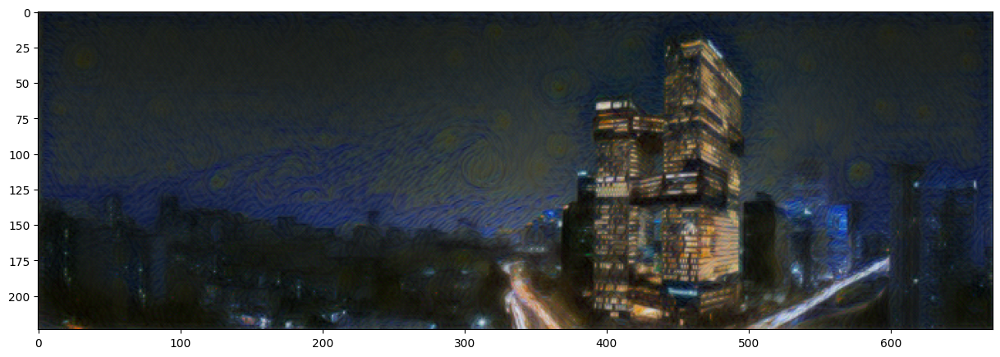

Total loss:  7704.98193359375


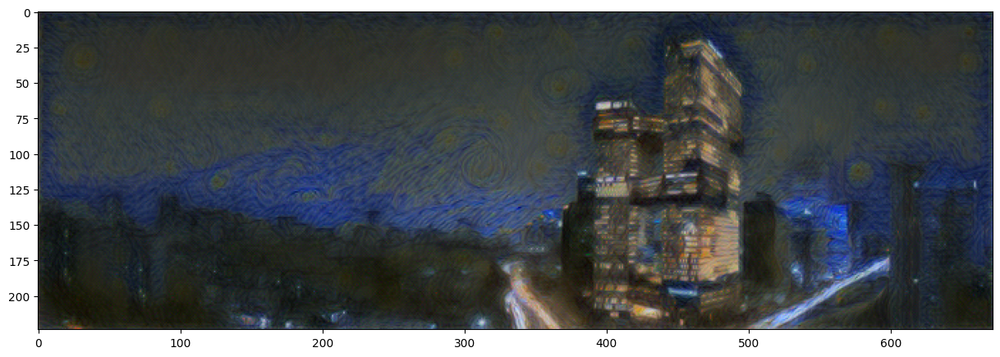

Total loss:  5075.3583984375


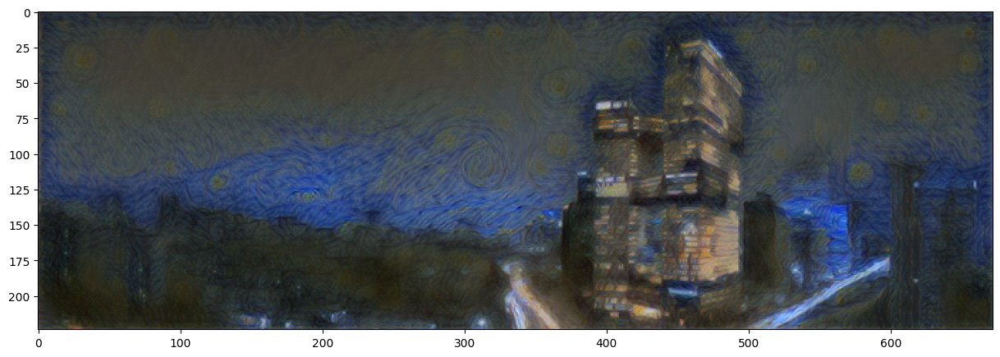

Total loss:  4105.70166015625


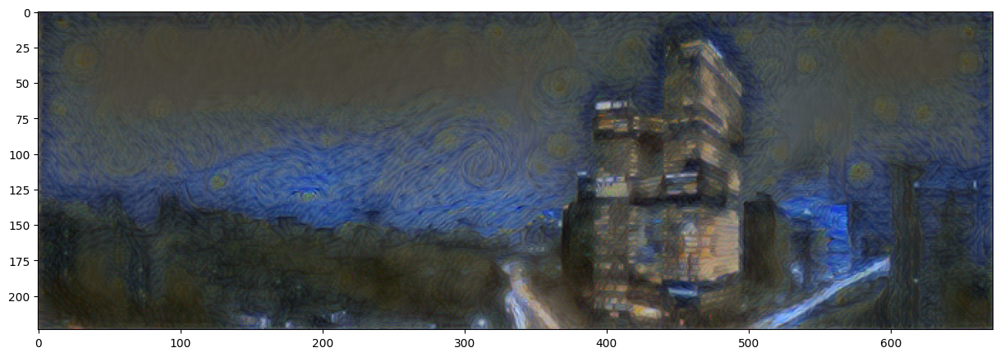

Total loss:  3654.771484375


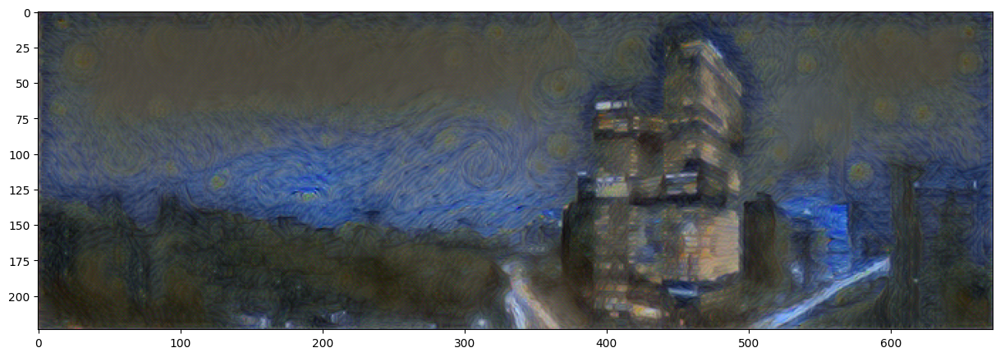

Total loss:  3402.079833984375


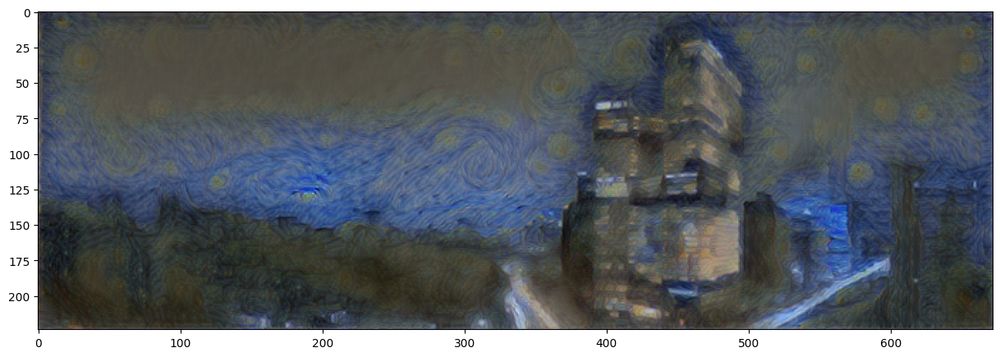

Total loss:  3234.75439453125


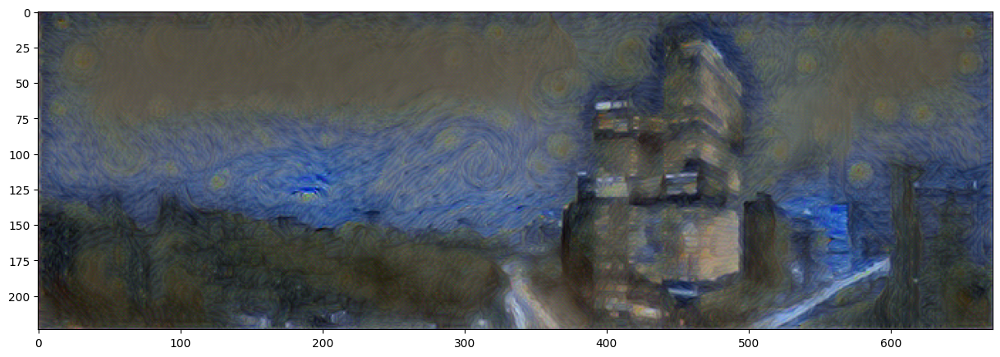

Total loss:  3110.546630859375


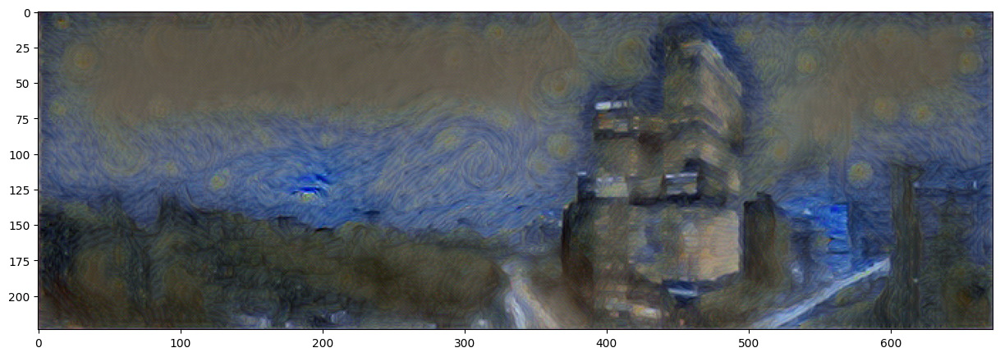

Total loss:  3007.76416015625


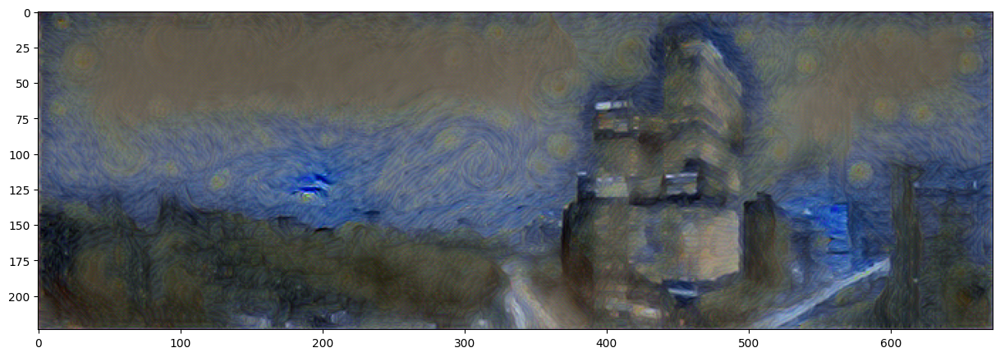

Total loss:  2918.344970703125


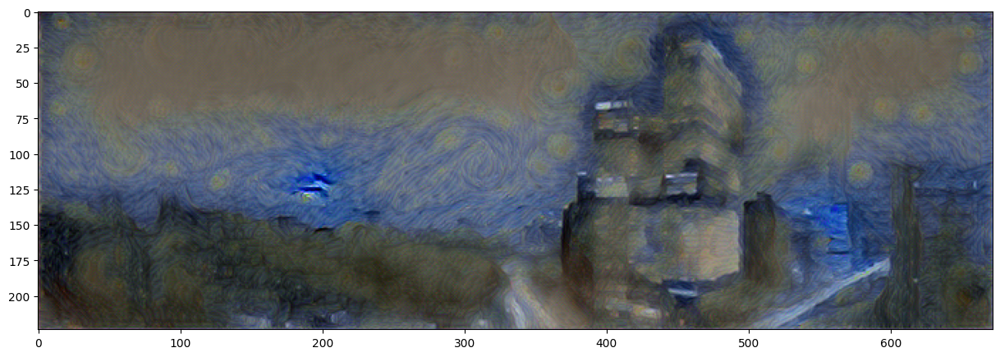

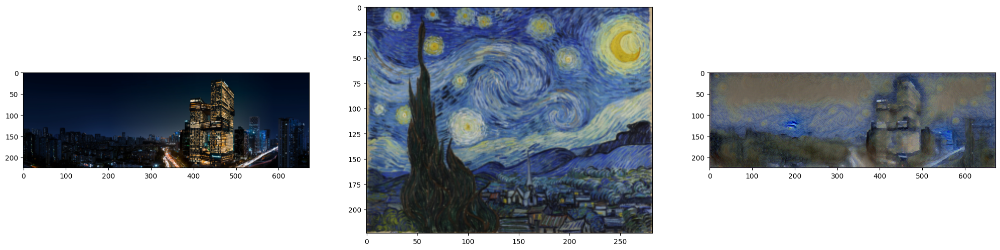

In [6]:
for i in range(1, steps + 1):
    target_features = get_features(target, net, layers)
    content_loss = torch.mean(
        (target_features["conv4_2"] - content_features["conv4_2"]) ** 2
    )

    style_loss = 0

    for layer in style_weights:
        _, d, h, w = target_features[layer].shape

        target_gram = gram_matrix(target_features[layer])
        layer_style_loss = style_weights[layer] * torch.mean(
            (target_gram - style_grams[layer]) ** 2
        )
        style_loss += layer_style_loss / (d * h * w)

    # total loss
    total_loss = content_weight * content_loss + style_weight * style_loss

    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    if i % show_every == 0:
        print("Total loss: ", total_loss.item())
        plt.figure(figsize=(15, 15))
        plt.imshow(image_convert(target))
        plt.show()


plt.figure(figsize=(25, 255))
plt.subplot(1, 3, 1)
plt.imshow(image_convert(content))

plt.subplot(1, 3, 2)
plt.imshow(image_convert(style))

plt.subplot(1, 3, 3)
plt.imshow(image_convert(target))

plt.show()

layer recon :  conv1_2
content recon loss:  0.019093245267868042


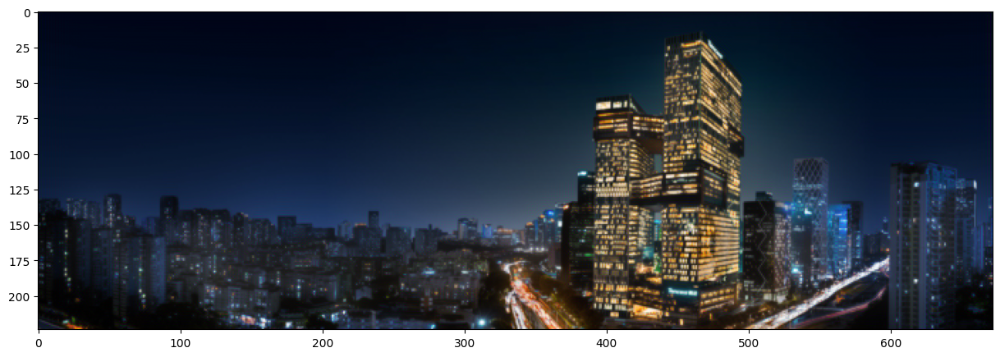

layer recon :  conv2_2
content recon loss:  0.2174069732427597


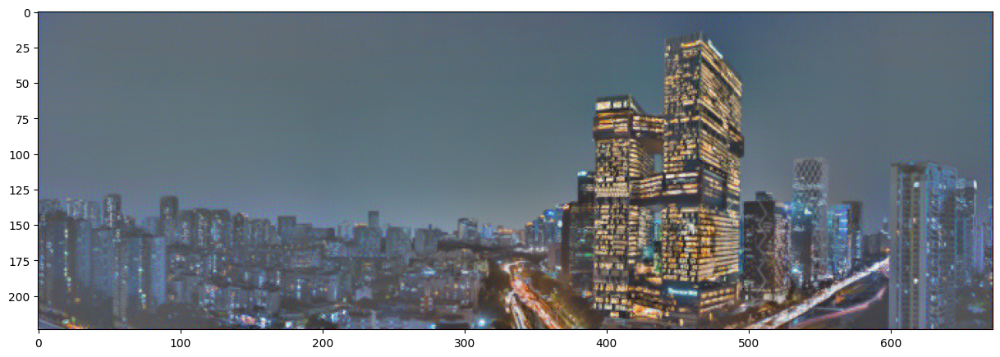

layer recon :  conv3_2
content recon loss:  0.3967844545841217


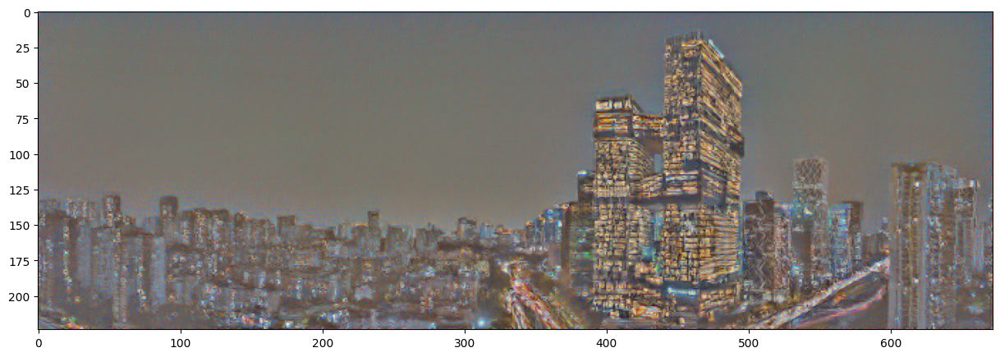

layer recon :  conv4_2
content recon loss:  0.08835023641586304


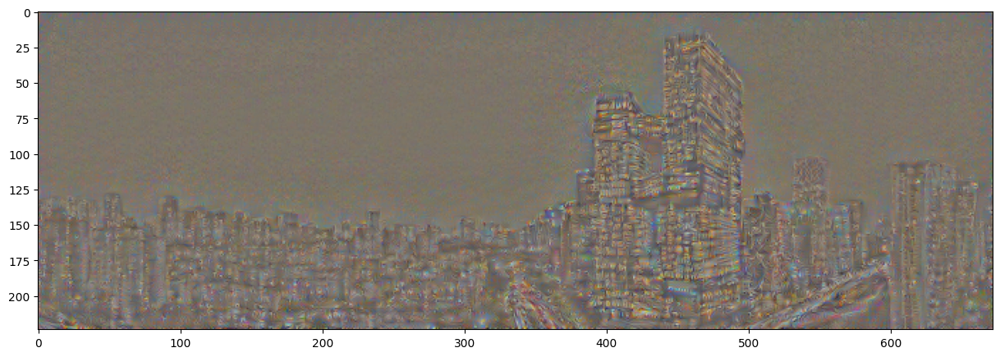

layer recon :  conv5_2
content recon loss:  0.00786336325109005


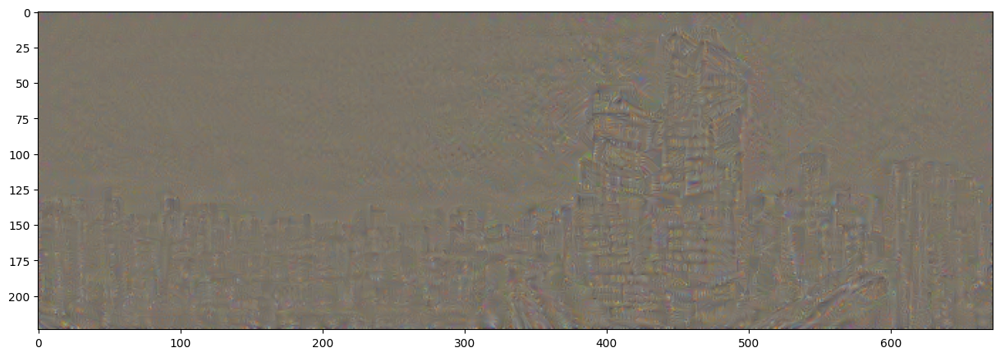

In [7]:
# content reconstruction
contents_recon_layers = {
    "2": "conv1_2",
    "7": "conv2_2",
    "12": "conv3_2",
    "21": "conv4_2",
    "30": "conv5_2",
}

content_features = get_features(content, net, contents_recon_layers)

for layer in contents_recon_layers:
    print("layer recon : ", contents_recon_layers[layer])
    style_recon = content.clone()
    style_recon[style_recon != 0] = 0
    style_recon = style_recon.requires_grad_(True).to(device)
    steps = 4000

    optimizer = optim.Adam([style_recon], lr=0.001)

    for i in range(1, steps + 1):
        content_recon_features = get_features(style_recon, net, contents_recon_layers)
        content_loss = torch.mean(
            (
                content_recon_features[contents_recon_layers[layer]]
                - content_features[contents_recon_layers[layer]]
            )
            ** 2
        )

        optimizer.zero_grad()
        content_loss.backward()
        optimizer.step()

    print("content recon loss: ", content_loss.item())
    plt.figure(figsize=(15, 15))
    plt.imshow(image_convert(style_recon))
    plt.show()

layer recon :  conv1_1
style recon loss:  0.19675111770629883


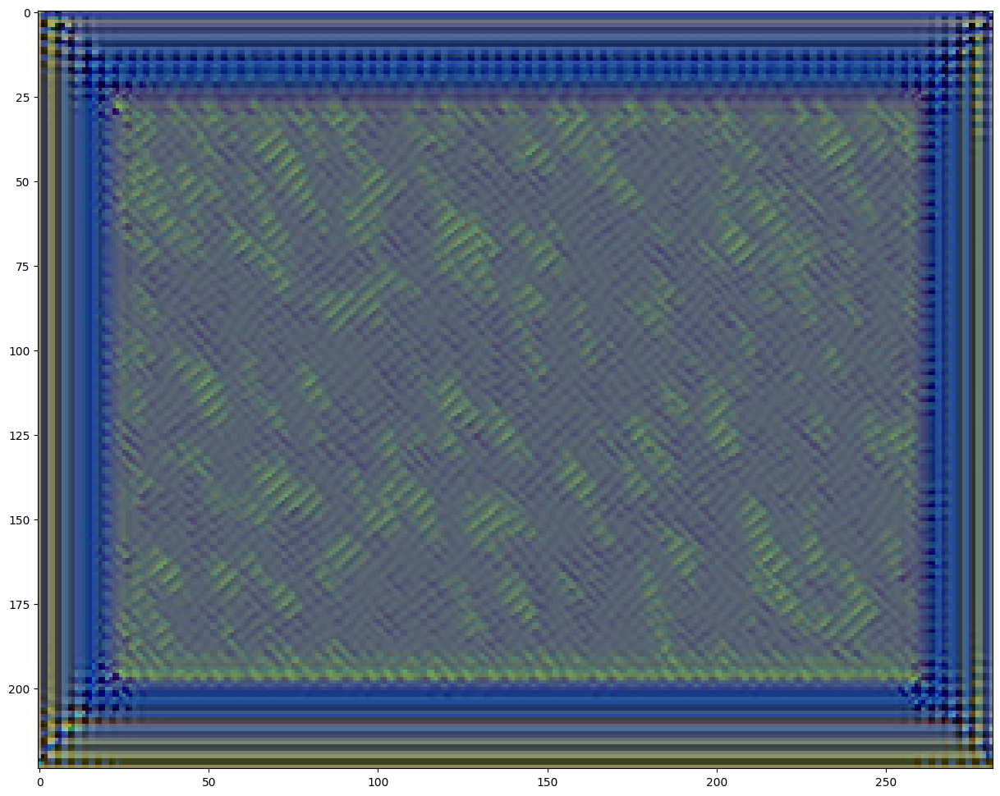

layer recon :  conv2_1
style recon loss:  0.6604328751564026


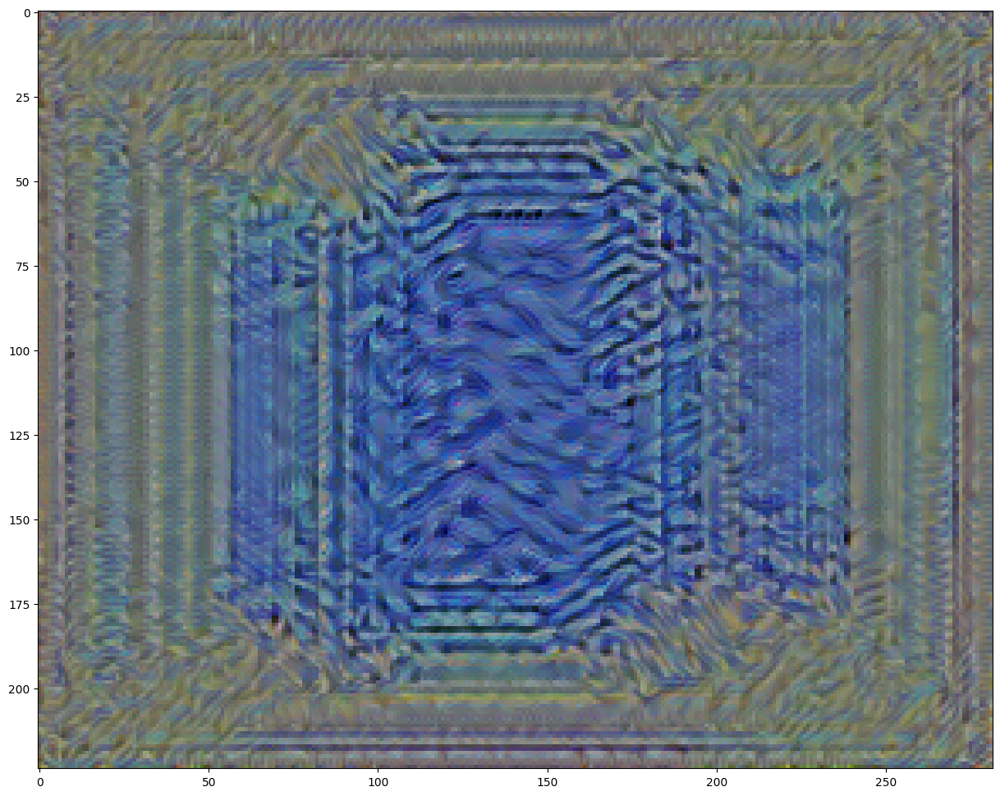

layer recon :  conv3_1
style recon loss:  1.3788832426071167


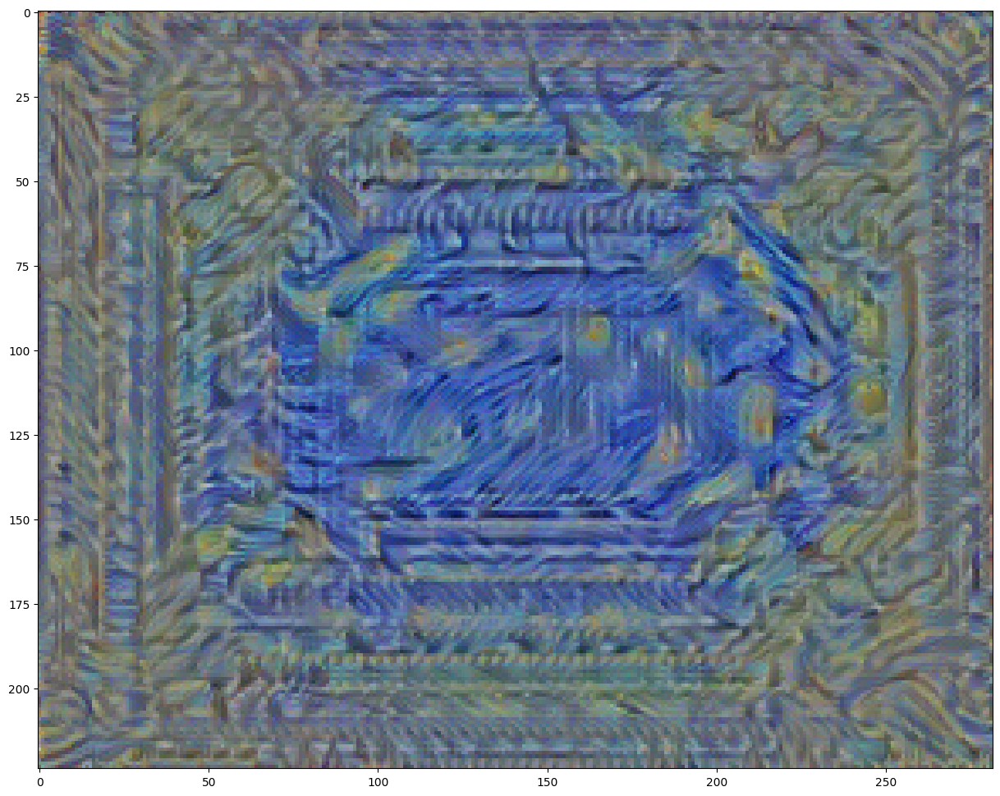

layer recon :  conv4_1
style recon loss:  2.3530139923095703


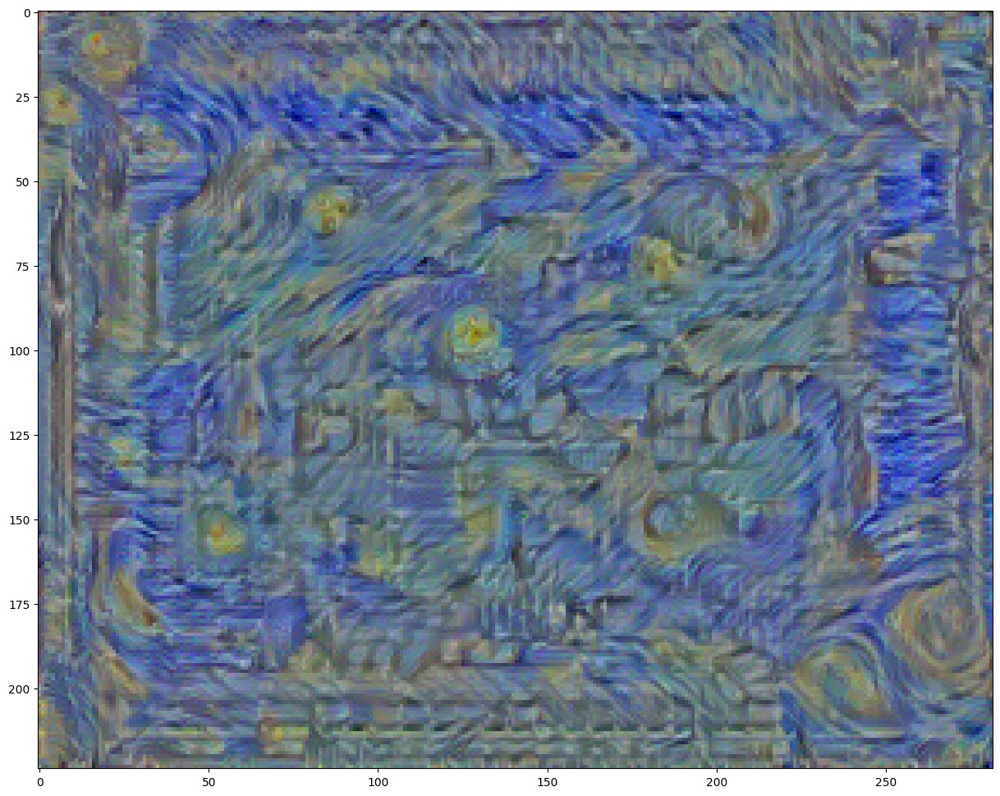

layer recon :  conv5_1
style recon loss:  2.3773927688598633


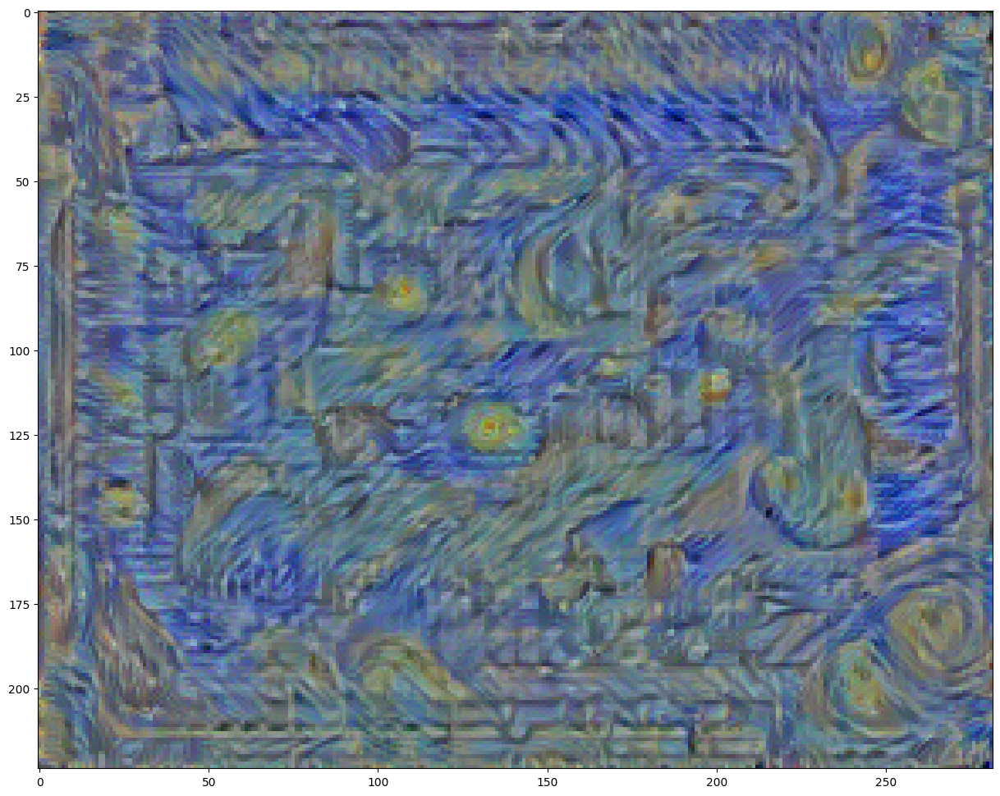

In [8]:
style_recon_layers = ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"]
style_recon_layers_arr = {
    "0": "conv1_1",
    "5": "conv2_1",
    "10": "conv3_1",
    "19": "conv4_1",
    "28": "conv5_1",
}
style_recon_grams = {
    layer: gram_matrix(style_features[layer]) for layer in style_features
}

for l in range(0, len(style_recon_layers)):
    print("layer recon : ", style_recon_layers[l])
    style_recon = style.clone()
    style_recon[style_recon != 0] = 0
    style_recon = style_recon.requires_grad_(True).to(device)
    steps = 4000

    optimizer = optim.Adam([style_recon], lr=0.001)

    for i in range(1, steps + 1):
        style_recon_features = get_features(style_recon, net, style_recon_layers_arr)
        style_total_loss = 0

        for c in range(0, l + 1):
            style_recon_feature = style_recon_features[style_recon_layers[c]]
            _, d, h, w = style_recon_feature.shape

            style_recon_gram = gram_matrix(style_recon_feature)
            style_loss = torch.mean(
                (style_recon_gram - style_recon_grams[style_recon_layers[c]]) ** 2
            )
            style_total_loss += style_loss / (d * h * w)

        optimizer.zero_grad()
        style_total_loss.backward()
        optimizer.step()

    print("style recon loss: ", style_total_loss.item())
    plt.figure(figsize=(15, 15))
    plt.imshow(image_convert(style_recon))
    plt.show()